In [1]:
# Libraries and utilities

import math
import matplotlib
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns





from collections import defaultdict
from scipy.stats.stats import pearsonr

In [2]:
#Clustering utilities

#scaling, normalization
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
#kmeans, dbscan, hierarchical (sklearn)
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
#evaluation
from sklearn.metrics import silhouette_score
#import dataset
from sklearn.datasets import load_iris

#distance matrix (dbscan elbow, hierarchical)
from scipy.spatial.distance import pdist, squareform
# hierarchical (scipy)
from scipy.cluster.hierarchy import linkage, dendrogram

In [3]:
# read dataset
df=pd.read_csv('prepared_ravdess_features.csv')
original_audio2=['length_ms','zero_crossings_sum','std','min', 'max','kur','skew']

In [4]:
#CREAZIONE NUOVO DATAFRAME SENZA FEATURE CATEGORICHE
continuos_df=df.copy()
continuos_df = continuos_df.drop(columns=['emotion','vocal_channel','emotional_intensity','statement','repetition','sex'],axis = 1)


In [5]:
X = continuos_df.values
y = np.array(df['emotion'])
y_map={"neutral":0,"calm":1,"happy":2,"sad":3,"angry":4,"fearful":5,"disgust":6,"surprised":7} #utile?
y_mapped = pd.DataFrame(y).iloc[:,0].map(y_map)

In [6]:
# Funzione per visualizzare SSE,Silhouette per tot istanze del K means
# utilizza il KneeLockator per identificare l ipotetico miglior K su cui va fatto tradeoff

#!pip install yellowbrick
#!pip install kneed
from kneed import KneeLocator
from yellowbrick.cluster import KElbowVisualizer

def res_K(df, features):
    print("Test effettuato sulle features:")
    print(features)
    scaler = RobustScaler()
    scaled_features = scaler.fit_transform(df[features])
    sse = {}
    silhouette = {}
    for k in range(2, 30):
        kmeans = KMeans( init="random", n_clusters=k, max_iter=1000).fit(scaled_features)
        #L'inertia è la somma delle distanza degli esempio rispetto al centro del cluster più vicino
        sse[k] = kmeans.inertia_
        silhouette[k] = silhouette_score(scaled_features, kmeans.labels_)
        
    plt.figure()
    plt.style.use('seaborn-darkgrid')
    plt.plot(list(sse.keys()), list(sse.values()))
    plt.xlabel("k")
    plt.ylabel("SSE")
    plt.show()
    kl = KneeLocator(
        range(2, 30), list(sse.values()), curve="convex", direction="decreasing"
    )
    
    print(kl.elbow)
    
    model = KMeans()
    visualizer = KElbowVisualizer(
            model, k=(2,30), metric='silhouette',locate_elbow=True
    )

    visualizer.fit(scaled_features)        # Fit the data to the visualizer
    visualizer.show()
    

    print("***************************************")
    
    return sse, silhouette, kl.elbow

In [7]:
!pip install yellowbrick
from yellowbrick.cluster import SilhouetteVisualizer

def Silhouette_plot(X_scal):
  colors=['C0', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9']
  #fig, axs = plt.subplots(30-2, 2, figsize=(10,10))
  for i in range(2, 11):
      kmeans = KMeans( init="random", n_clusters=i, max_iter=1000)
      visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
      print('k = '+str(i))
      #axs[i-2][0].set_ylabel("k=" + str(i))
      visualizer.fit(X_scal)
      visualizer.show()
      #plt.tight_layout()

Test effettuato sulle features:
['length_ms', 'zero_crossings_sum', 'std', 'min', 'max', 'kur', 'skew']


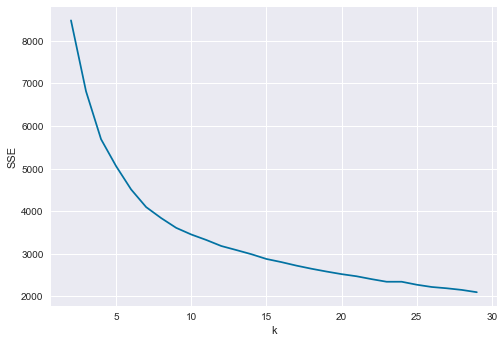

8


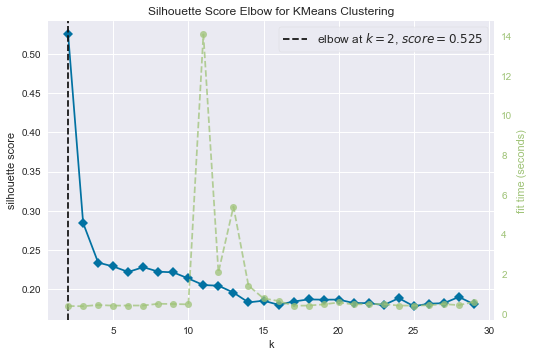

***************************************
k = 2| SSE = 8480.936067202332| silhouette = 0.5254525216896048
k = 3| SSE = 6816.800165870128| silhouette = 0.2822152865199308
k = 4| SSE = 5691.6187009461855| silhouette = 0.23345725753323515
k = 5| SSE = 5060.153617895118| silhouette = 0.2285432523097426
k = 6| SSE = 4512.306946041821| silhouette = 0.22122722389248983
k = 7| SSE = 4098.066339395498| silhouette = 0.22769988277530206
k = 8| SSE = 3839.9083663186484| silhouette = 0.2225716017652733
k = 9| SSE = 3610.5666660502557| silhouette = 0.2204693627794777
k = 10| SSE = 3455.0863247332218| silhouette = 0.21291682121347275
k = 11| SSE = 3326.350724442573| silhouette = 0.20215685986294926
k = 12| SSE = 3184.367427835382| silhouette = 0.19467989389223134
k = 13| SSE = 3089.498084972288| silhouette = 0.18967883931058452
k = 14| SSE = 2992.0883185654075| silhouette = 0.1871096479991055
k = 15| SSE = 2880.341964907966| silhouette = 0.18307436964494042
k = 16| SSE = 2806.390807571199| silhouette =

In [8]:
# Exp. original_audio tranne media,frame_witdh ---> k=8 migliore

sse, silhouette, kl = res_K(df, original_audio2)
for i in range(2, 30):
    print("k = " + str(i) + "| SSE = " + str(sse[i]) + "| silhouette = " + str(silhouette[i]))
print(kl)

SILHOUETTE PLOT PER K=[2,30]

k = 2


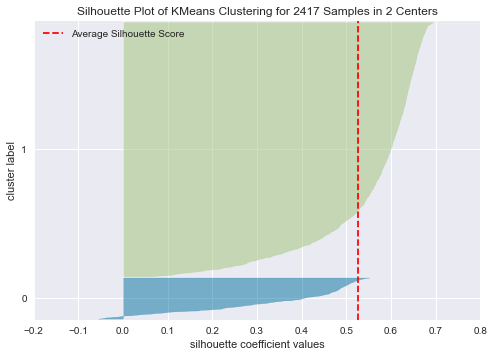

k = 3


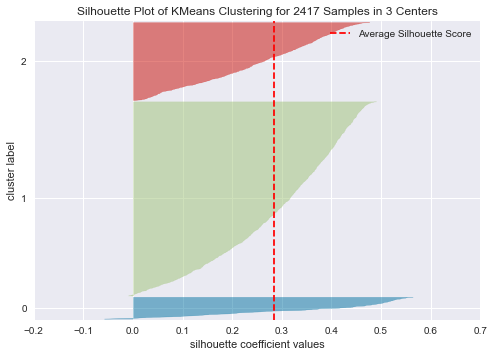

k = 4


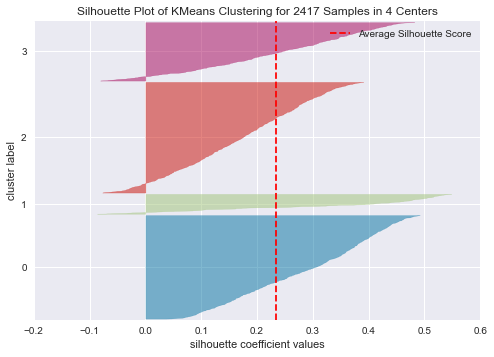

k = 5


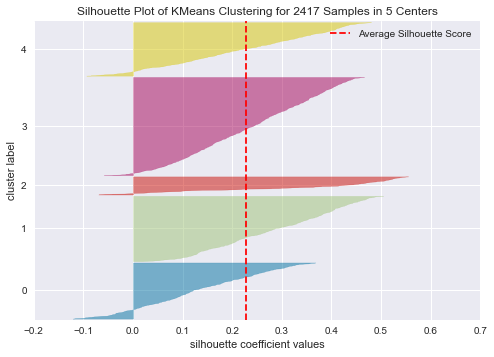

k = 6


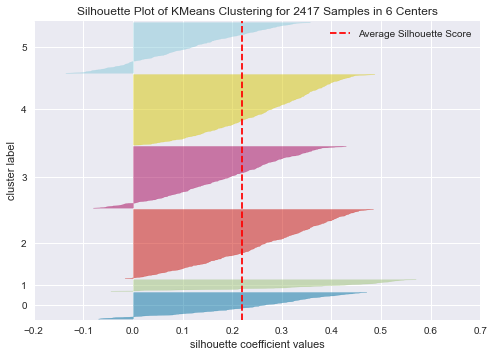

k = 7


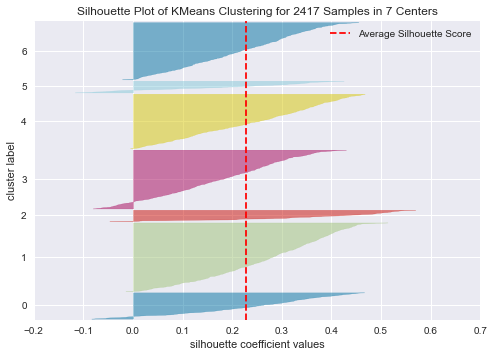

k = 8


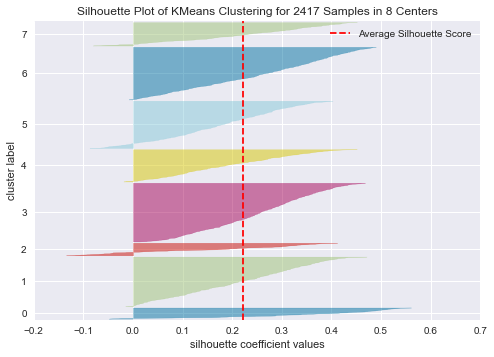

k = 9


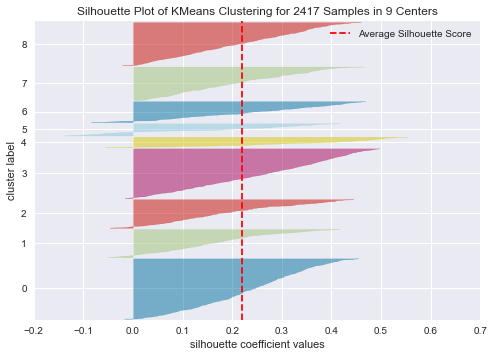

k = 10


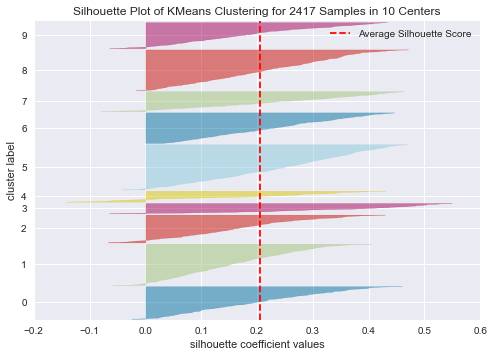

In [9]:
scaler = RobustScaler()
scaled_features = scaler.fit_transform(df[original_audio2])
Silhouette_plot(scaled_features)


In [10]:
X11=continuos_df[original_audio2]
scaler = RobustScaler() 
scaler.fit(X11)
X11_scal = scaler.transform(X11)

kmeans = KMeans(init='k-means++', n_clusters=9, n_init=10, max_iter=100)
kmeans.fit(X11_scal)
np.unique(kmeans.labels_, return_counts=True)

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 array([283, 177, 354,  88, 235, 416, 108, 497, 259], dtype=int64))

In [11]:
continuos_df[original_audio2]

,length_ms,zero_crossings_sum,std,min,max,kur,skew
0,3737,16995,0.014482,-0.128632,0.138947,9.406061,0.273153
1,3904,13906,0.020417,-0.305725,0.263062,19.564187,0.292157
2,4671,18723,0.024317,-0.137482,0.166351,4.881241,0.302659
3,3637,11617,0.003561,-0.027374,0.024078,13.040259,-0.081014
4,4404,15137,0.027522,-0.192169,0.242676,7.485109,0.414872
...,...,...,...,...,...,...,...
2412,4605,9871,0.005260,-0.039856,0.052399,9.551363,0.759247
2413,4171,8963,0.006836,-0.064178,0.084045,22.517991,1.073633
2414,5239,9765,0.015384,-0.093079,0.097260,4.964319,-0.005821
2415,3737,9716,0.005182,-0.057556,0.052002,13.855588,-0.110966


PARALLEL PLOT

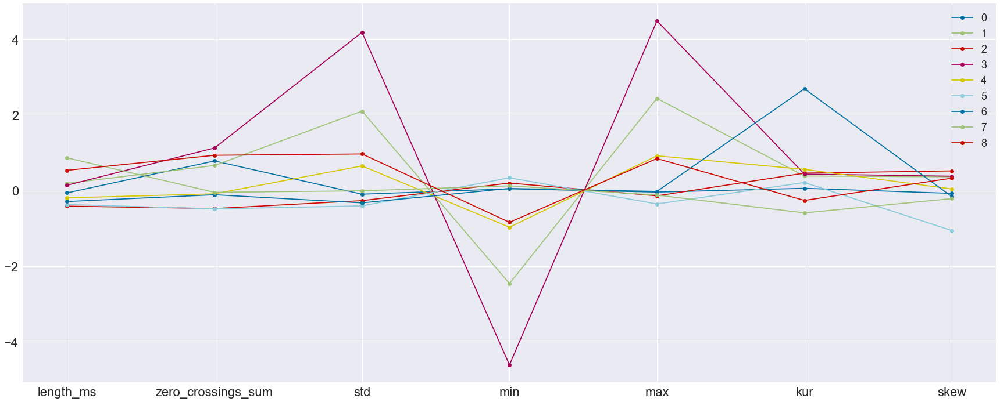

In [12]:
# Parallel plot per K-means con k=9 per audio originale tranne mean,frame_width

centers = kmeans.cluster_centers_
#centers = scaler.inverse_transform(centers) #denormalizziamo le coordinate dei centroidi

plt.figure(figsize=(30, 12))


for i in range(len(centers)): # itero sulle coordinate dei 9 centri
    plt.plot(centers[i], marker='o', label=i)
    
plt.xticks(range(0,len(original_audio2)), original_audio2, fontsize=15)
#plt.yticks(fontsize=15)

plt.tick_params(axis='both', which='major', labelsize=22)



plt.legend(fontsize=18, loc='best')
#plt.grid(axis='y')

plt.show()

SCATTERPLOT VARI

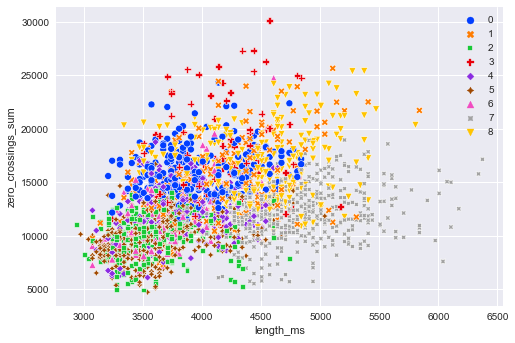

In [13]:
sns.scatterplot(data=continuos_df, x="length_ms", y="zero_crossings_sum", hue=kmeans.labels_, style=kmeans.labels_,
                palette="bright")
plt.show()

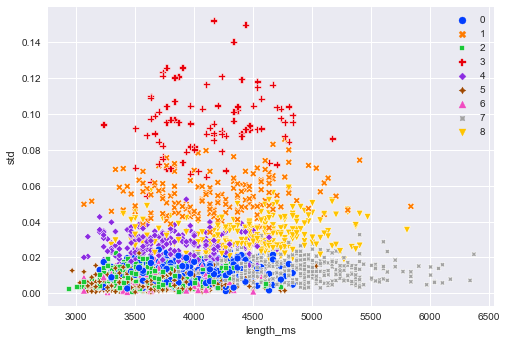

In [14]:
sns.scatterplot(data=continuos_df, x="length_ms", y="std", hue=kmeans.labels_, style=kmeans.labels_,
                palette="bright")
plt.show()

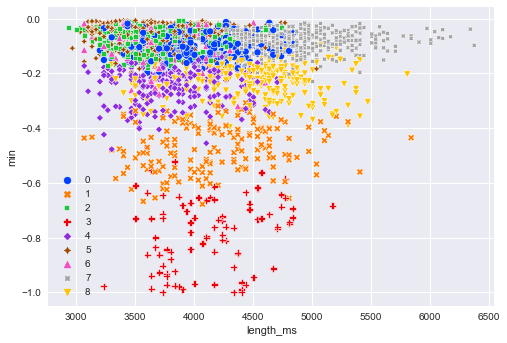

In [15]:
sns.scatterplot(data=continuos_df, x="length_ms", y="min", hue=kmeans.labels_, style=kmeans.labels_,
                palette="bright")
plt.show()

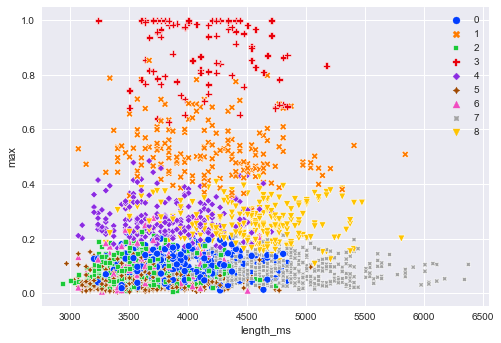

In [16]:
sns.scatterplot(data=continuos_df, x="length_ms", y="max", hue=kmeans.labels_, style=kmeans.labels_,
                palette="bright")
plt.show()

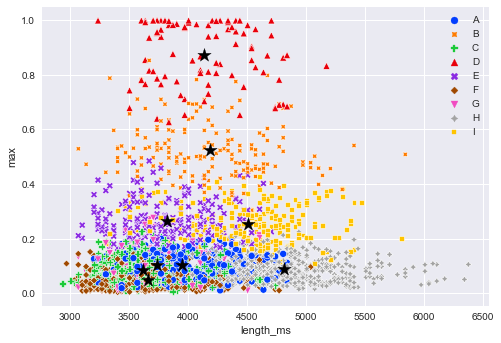

In [17]:
centers = kmeans.cluster_centers_
centers = scaler.inverse_transform(centers) #denormalizziamo le coordinate dei centroidi

continuos_df['kmeans_labels'] = kmeans.labels_ # creo nuova variabile per il dataframe e assegno ogni punto al suo cluster
continuos_df['kmeans_labels'] = continuos_df['kmeans_labels'].map({0:"A", 1: "B", 2: "C",3:"D",4:"E",5:"F",6:"G",7:"H",8:"I"})

sns.scatterplot(data=continuos_df, x="length_ms", y="max", hue='kmeans_labels', style='kmeans_labels',
                palette="bright", hue_order=["A","B","C","D","E","F","G","H","I"])
plt.legend()
plt.scatter(centers[:,0], centers[:,4], c='black', marker='*', s=200) # per vedere l indice associato a 4 guardare scatterplot
plt.show()

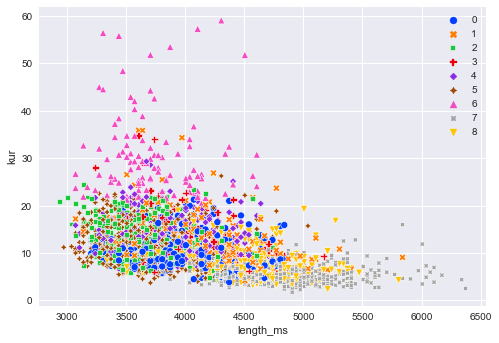

In [18]:
sns.scatterplot(data=continuos_df, x="length_ms", y="kur", hue=kmeans.labels_, style=kmeans.labels_,
                palette="bright")
plt.show()

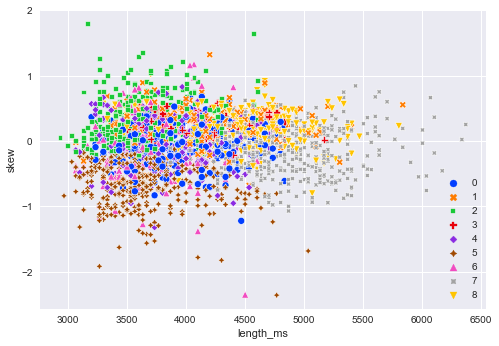

In [19]:
sns.scatterplot(data=continuos_df, x="length_ms", y="skew", hue=kmeans.labels_, style=kmeans.labels_,
                palette="bright")
plt.show()

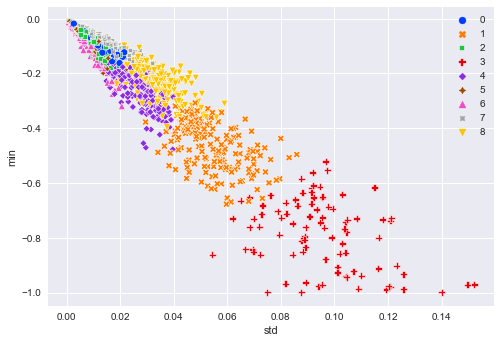

In [20]:
sns.scatterplot(data=continuos_df, x="std", y="min", hue=kmeans.labels_, style=kmeans.labels_,
                palette="bright")
plt.show()

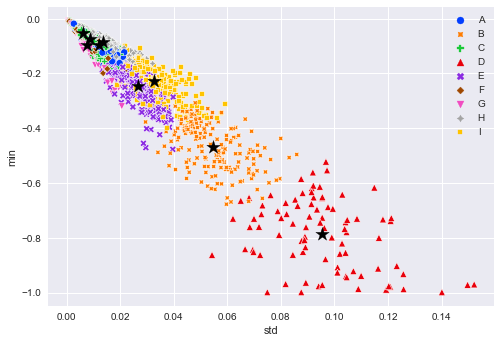

In [21]:
#centers = kmeans.cluster_centers_
#centers = scaler.inverse_transform(centers) #denormalizziamo le coordinate dei centroidi

sns.scatterplot(data=continuos_df, x="std", y="min", hue='kmeans_labels', style='kmeans_labels',
                palette="bright", hue_order=["A","B","C","D","E","F","G","H","I"])
plt.legend()
plt.scatter(centers[:,2], centers[:,3], c='black', marker='*', s=200) # per vedere l indice associato a 4 guardare scatterplot
plt.show()

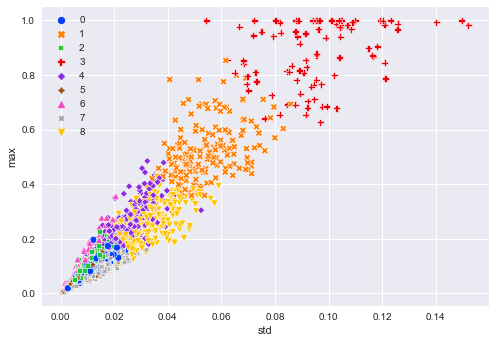

In [22]:
sns.scatterplot(data=continuos_df, x="std", y="max", hue=kmeans.labels_, style=kmeans.labels_,
                palette="bright")
plt.show()

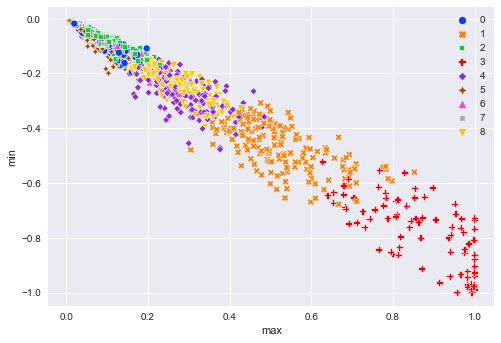

In [23]:
sns.scatterplot(data=continuos_df, x="max", y="min", hue=kmeans.labels_, style=kmeans.labels_,
                palette="bright")
plt.show()

In [24]:
#DENORMALIZZO CENTROIDI E AGGIUNGO LA CORRISPONDENTE LABEL AD OGNI RECORD NEL DATASET

centers = kmeans.cluster_centers_
centers = scaler.inverse_transform(centers) #denormalizziamo le coordinate dei centroidi
continuos_df['kmeans_labels'] = kmeans.labels_ # creo nuova variabile per il dataframe e assegno ogni punto al suo cluster
continuos_df['kmeans_labels'] = continuos_df['kmeans_labels'].map({0:"A", 1: "B", 2: "C",3:"D",4:"E",5:"F",6:"G",7:"H",8:"I"})

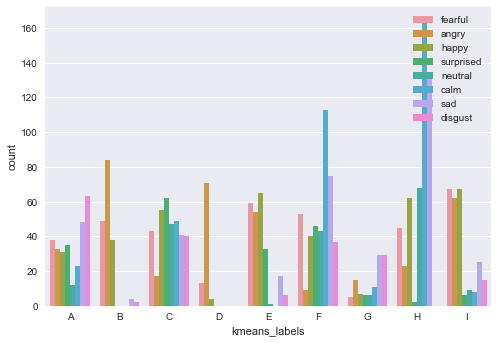

In [25]:
#COUNTPLOT
sns.countplot(data=continuos_df, x='kmeans_labels', hue=y,order=["A","B","C","D","E","F","G","H","I"])
plt.show()

3D PLOT

C:\Users\david\AppData\Local\Temp\ipykernel_6280\2724254571.py:10: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  fig.colorbar(p)


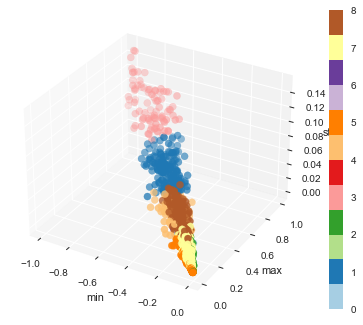

In [26]:
continuos_df_copy= continuos_df.copy()
continuos_df_copy["kmeans_labels"]=kmeans.labels_
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d', facecolor='white')
x = continuos_df_copy['min']
y = continuos_df_copy['max']
z = continuos_df_copy['std']

p = ax.scatter(x,y,z, marker="o", c=continuos_df_copy["kmeans_labels"], s=50, cmap="Paired")
fig.colorbar(p)
ax.set_xlabel('min')
ax.set_ylabel('max')
ax.set_zlabel('std')
plt.show()

QUALCHE CROSSTAB

In [27]:
continuos_df.head()

,frame_width,length_ms,zero_crossings_sum,mfcc_mean,mfcc_std,mfcc_min,mfcc_max,sc_mean,sc_std,sc_min,...,stft_min,stft_kur,stft_skew,mean,std,min,max,kur,skew,kmeans_labels
0,2,3737,16995,-33.485947,134.654860,-755.22345,171.69092,5792.550744,3328.055457,0.0,...,0.0,-1.215025,0.403514,3.844916e-07,0.014482,-0.128632,0.138947,9.406061,0.273153,A
1,2,3904,13906,-29.502108,130.485630,-713.98560,205.00770,5197.620555,4040.931570,0.0,...,0.0,-1.384174,0.290905,-7.149491e-08,0.020417,-0.305725,0.263062,19.564187,0.292157,E
2,2,4671,18723,-30.532463,126.577110,-726.06036,165.45653,4830.743037,3332.131300,0.0,...,0.0,-1.242947,0.470350,2.429985e-06,0.024317,-0.137482,0.166351,4.881241,0.302659,I
3,2,3637,11617,-36.059555,159.725160,-842.94635,190.03609,5376.446478,4053.663073,0.0,...,0.0,-1.445318,0.274756,2.373929e-07,0.003561,-0.027374,0.024078,13.040259,-0.081014,C
4,2,4404,15137,-31.405996,122.125824,-700.70276,161.13400,5146.012474,3442.724109,0.0,...,0.0,-1.366742,0.318926,8.454691e-07,0.027522,-0.192169,0.242676,7.485109,0.414872,I


In [28]:
emotion_labels=pd.crosstab(df['emotion'],continuos_df['kmeans_labels'])
emotion_labels

kmeans_labels,A,B,C,D,E,F,G,H,I
emotion,,,,,,,,,
angry,33,84,17,71,54,9,15,23,62
calm,23,0,49,0,0,113,11,164,8
disgust,63,2,40,0,6,37,29,0,15
fearful,38,49,43,13,59,53,5,45,67
happy,31,38,55,4,65,40,7,62,67
neutral,12,0,47,0,1,43,6,68,9
sad,48,4,41,0,17,75,29,133,25
surprised,35,0,62,0,33,46,6,2,6


In [29]:
vocalchannel_labels=pd.crosstab(df['vocal_channel'],continuos_df['kmeans_labels'])
vocalchannel_labels

kmeans_labels,A,B,C,D,E,F,G,H,I
vocal_channel,,,,,,,,,
song,50,74,11,19,63,44,1,458,187
speech,233,103,343,69,172,372,107,39,72


In [30]:
emotionalintensity_labels=pd.crosstab(df['emotional_intensity'],continuos_df['kmeans_labels'])
emotionalintensity_labels

kmeans_labels,A,B,C,D,E,F,G,H,I
emotional_intensity,,,,,,,,,
normal,156,17,266,1,63,298,71,332,96
strong,127,160,88,87,172,118,37,165,163


In [31]:
statement_labels=pd.crosstab(df['statement'],continuos_df['kmeans_labels'])
statement_labels

kmeans_labels,A,B,C,D,E,F,G,H,I
statement,,,,,,,,,
Dogs are sitting by the door,174,90,157,43,95,217,26,249,150
Kids are talking by the door,109,87,197,45,140,199,82,248,109


In [32]:
repetition_labels=pd.crosstab(df['repetition'],continuos_df['kmeans_labels'])
repetition_labels

kmeans_labels,A,B,C,D,E,F,G,H,I
repetition,,,,,,,,,
1st,140,85,181,42,122,206,53,248,128
2nd,143,92,173,46,113,210,55,249,131


In [33]:
sex_labels=pd.crosstab(df['sex'],continuos_df['kmeans_labels'])
sex_labels

kmeans_labels,A,B,C,D,E,F,G,H,I
sex,,,,,,,,,
F,218,104,152,49,88,156,36,215,169
M,65,73,202,39,147,260,72,282,90


DBSCAN

In [34]:
#-prima calcoliamo la matrice del kth vicino per ogni punto
#-poi dalla matrice facciamo il grafico per scegliere il gomito=epsilon richiesto per un buon DBSCAN clustering


dist = pdist(X11_scal, 'euclidean') # usiamo la distanza euclidea
dist = squareform(dist) #miglior formattazione della matrice

In [35]:
k=15 # seleziono MinPts
kth_distances = [] # in questo caso non cerchiamo SSE ma la lista dei k punti più vicini
for d in dist:  # d is a vector containing distances between the ith record and all the others
    index_kth_distance = np.argsort(d)[k]  # take the index of the kth nearest neighbor
    kth_distances.append(d[index_kth_distance])  # store the distance in a list

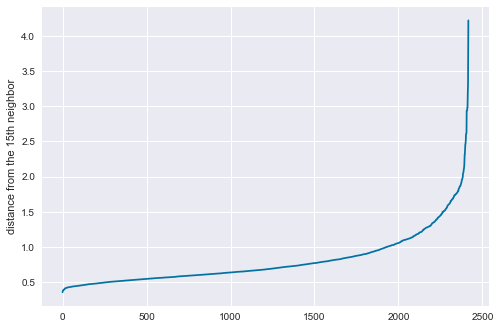

In [36]:
# Visualizzazione della matrice dei Kth vicini ---> come per il K-Means si scegli un valore dove cè il gomito più alto
# ---> quindi un valore compreso tra [0.20,0.25] nell' asse y per evitare Noise Points 

# DOMANDA DA FARE: Come fissare MinPts?

plt.plot(range(0, len(kth_distances)), sorted(kth_distances))
plt.ylabel('distance from the {}th neighbor'.format(k))
         
plt.show()

da questo test si evince che il miglior epsilon =1.5

Adesso facciamo un nuovo test provando diverse combinazioni di epsilon=[0.1,2] e minPts=[5,50]

In [37]:
eps_to_test = [round(eps,1) for eps in np.arange(0.1, 2, 0.1)]
min_samples_to_test = range(5, 50, 5)
#min_samples_to_test = range(5, 15, 1)

print("EPS:", eps_to_test)
print("MIN_SAMPLES:", list(min_samples_to_test))

scaled_dataframe=pd.DataFrame(X11_scal,columns=continuos_df[original_audio2].columns)


"""
Dato che il DBSCAN si preoccupa poco della forma del cluster l'utilizzo di una metrica come l'indice di Silhouette sarebbe inappropriato. Proprio per questo motivo possiamo provare a creare un paio di metriche home-made per avere contezza di come va la clusterizzazione con la combinazione di iperparametri imposti.

In particolare, ad ogni combinazione di iperparametri:

0.1   5 - 0.1  10 - 0.1  15 - ... - 1.9  45

Verrà eseguita prima la clusterizzazione e poi il calcolo delle metriche. Ad esempio potremmo utilizzare:

Distanza media tra i noise points e i 6 punti più vicini (6-NN)
Numero di cluster che vengono individuati
Scriviamo quanto detto all'interno della funzione get_metric() che, una volta all'interno del grid search, si occuperà di restituire automaticamente le metriche ad ogni combinazione di iperparametri:

"""

EPS: [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9]
MIN_SAMPLES: [5, 10, 15, 20, 25, 30, 35, 40, 45]


"\nDato che il DBSCAN si preoccupa poco della forma del cluster l'utilizzo di una metrica come l'indice di Silhouette sarebbe inappropriato. Proprio per questo motivo possiamo provare a creare un paio di metriche home-made per avere contezza di come va la clusterizzazione con la combinazione di iperparametri imposti.\n\nIn particolare, ad ogni combinazione di iperparametri:\n\n0.1   5 - 0.1  10 - 0.1  15 - ... - 1.9  45\n\nVerrà eseguita prima la clusterizzazione e poi il calcolo delle metriche. Ad esempio potremmo utilizzare:\n\nDistanza media tra i noise points e i 6 punti più vicini (6-NN)\nNumero di cluster che vengono individuati\nScriviamo quanto detto all'interno della funzione get_metric() che, una volta all'interno del grid search, si occuperà di restituire automaticamente le metriche ad ogni combinazione di iperparametri:\n\n"

In [38]:
from sklearn.neighbors import NearestNeighbors


def get_metrics(eps, min_samples, dataset, iter_):
    
    # Fitting ======================================================================
    
    dbscan_model_ = DBSCAN( eps = eps, min_samples = min_samples)
    dbscan_model_.fit(dataset)
    
    # Mean Noise Point Distance metric =============================================
    noise_indices = dbscan_model_.labels_ == -1
    
    if True in noise_indices:
        neighboors = NearestNeighbors(n_neighbors = 6).fit(dataset)
        distances, indices = neighboors.kneighbors(dataset)
        noise_distances = distances[noise_indices, 1:]
        noise_mean_distance = round(noise_distances.mean(), 3)
    else:
        noise_mean_distance = None
        
    # Number of found Clusters metric ==============================================
    
    number_of_clusters = len(set(dbscan_model_.labels_[dbscan_model_.labels_ >= 0]))
    
    # Log ==========================================================================
    
    print("%3d | Tested with eps = %3s and min_samples = %3s | %5s %4s" % (iter_, eps, min_samples, str(noise_mean_distance), number_of_clusters))
        
    return(noise_mean_distance, number_of_clusters)
    

In [39]:
# Istanziamo i due dataframe che conterranno i risultati del grid search

# Dataframe per la metrica sulla distanza media dei noise points dai K punti più vicini
results_noise = pd.DataFrame( 
    data = np.zeros((len(eps_to_test),len(min_samples_to_test))), # Empty dataframe
    columns = min_samples_to_test, 
    index = eps_to_test
)

# Dataframe per la metrica sul numero di cluster
results_clusters = pd.DataFrame( 
    data = np.zeros((len(eps_to_test),len(min_samples_to_test))), # Empty dataframe
    columns = min_samples_to_test, 
    index = eps_to_test
)

In [40]:
# ADESSO LANCIAMO IL GRID SEARCH

iter_ = 0

print("ITER| INFO%s |  DIST    CLUS" % (" "*39))
print("-"*65)

for eps in eps_to_test:
    for min_samples in min_samples_to_test:
        
        iter_ += 1
        
        # Calcolo le metriche
        noise_metric, cluster_metric = get_metrics(eps, min_samples, scaled_dataframe, iter_)
        
        # Inserisco i risultati nei relativi dataframe
        results_noise.loc[eps, min_samples] = noise_metric
        results_clusters.loc[eps, min_samples] = cluster_metric

ITER| INFO                                        |  DIST    CLUS
-----------------------------------------------------------------
  1 | Tested with eps = 0.1 and min_samples =   5 | 0.538    0
  2 | Tested with eps = 0.1 and min_samples =  10 | 0.538    0
  3 | Tested with eps = 0.1 and min_samples =  15 | 0.538    0
  4 | Tested with eps = 0.1 and min_samples =  20 | 0.538    0
  5 | Tested with eps = 0.1 and min_samples =  25 | 0.538    0
  6 | Tested with eps = 0.1 and min_samples =  30 | 0.538    0
  7 | Tested with eps = 0.1 and min_samples =  35 | 0.538    0
  8 | Tested with eps = 0.1 and min_samples =  40 | 0.538    0
  9 | Tested with eps = 0.1 and min_samples =  45 | 0.538    0
 10 | Tested with eps = 0.2 and min_samples =   5 | 0.539    1
 11 | Tested with eps = 0.2 and min_samples =  10 | 0.538    0
 12 | Tested with eps = 0.2 and min_samples =  15 | 0.538    0
 13 | Tested with eps = 0.2 and min_samples =  20 | 0.538    0
 14 | Tested with eps = 0.2 and min_samples =  25

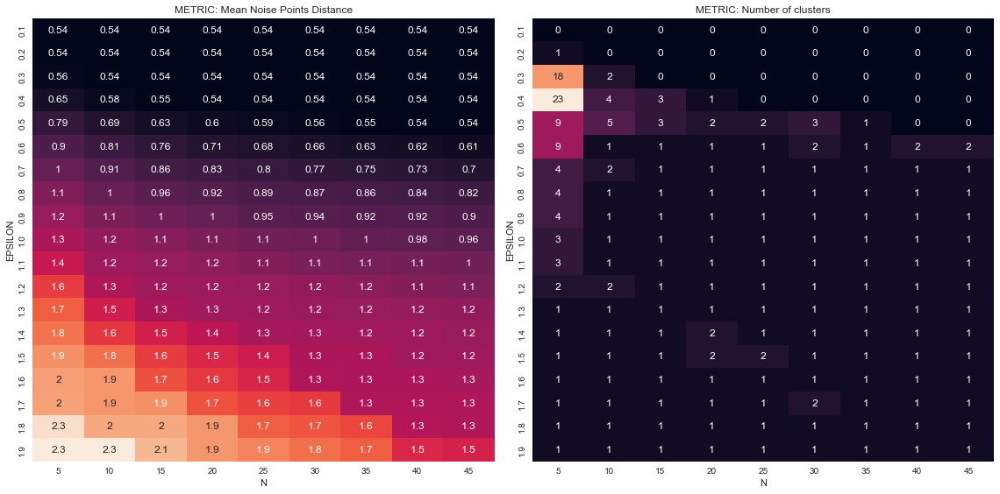

In [41]:
# Mostriamo i risultati del grid search appena eseguito per cercare la "miglior" combinazione di iperparametri:

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8) )

sns.heatmap(results_noise, annot = True, ax = ax1, cbar = False).set_title("METRIC: Mean Noise Points Distance")
sns.heatmap(results_clusters, annot = True, ax = ax2, cbar = False).set_title("METRIC: Number of clusters")

ax1.set_xlabel("N"); ax2.set_xlabel("N")
ax1.set_ylabel("EPSILON"); ax2.set_ylabel("EPSILON")

plt.tight_layout(); plt.show()

In [42]:
"""

Analizzando le due heatmap ci accorgiamo subito che per bassi valori di ε praticamente tutti i punti vengono identificati come noise points (0 cluster).
Viceversa, per alti valori di ε tendiamo ad avere un solo cluster.

Per il nostro dataset potremmo scegliere  4 opzioni:

1) Scegliere un valore molto alto di distanza media tra noise points(1.5) e minPts=20 che corrisponde ad epsilon=1.5 e restituisce 2 cluster
2) Scegliere un valore più basso di distanza media tra noise points(0.91) e minPts=10 che corrisponde ad epsilon=0.7 e restituisce 2 cluster
3) Facendo un possibile tradeoff tra i risultati delle heatmap e la tecnica del gomito visto precedentemente si potrebbe scegliere anche un valore epsilon=1.2
   caratterizzato da distanza media tra noise points(1.3) e minPts(10) che restituisce sempre 2 cluster
4) Essendo un dataset molto vasto si potrebbe anche pensare di aumentare il numero di cluster ottenibili,scegliendo quindi 3 cluster, caratterizati
   da distanza media tra noise points(0.63), minPts=15 con corrispondente valore di epsilon=0.5

"""

'\n\nAnalizzando le due heatmap ci accorgiamo subito che per bassi valori di ε praticamente tutti i punti vengono identificati come noise points (0 cluster).\nViceversa, per alti valori di ε tendiamo ad avere un solo cluster.\n\nPer il nostro dataset potremmo scegliere  4 opzioni:\n\n1) Scegliere un valore molto alto di distanza media tra noise points(1.5) e minPts=20 che corrisponde ad epsilon=1.5 e restituisce 2 cluster\n2) Scegliere un valore più basso di distanza media tra noise points(0.91) e minPts=10 che corrisponde ad epsilon=0.7 e restituisce 2 cluster\n3) Facendo un possibile tradeoff tra i risultati delle heatmap e la tecnica del gomito visto precedentemente si potrebbe scegliere anche un valore epsilon=1.2\n   caratterizzato da distanza media tra noise points(1.3) e minPts(10) che restituisce sempre 2 cluster\n4) Essendo un dataset molto vasto si potrebbe anche pensare di aumentare il numero di cluster ottenibili,scegliendo quindi 3 cluster, caratterizati\n   da distanza me

OPZIONE 1

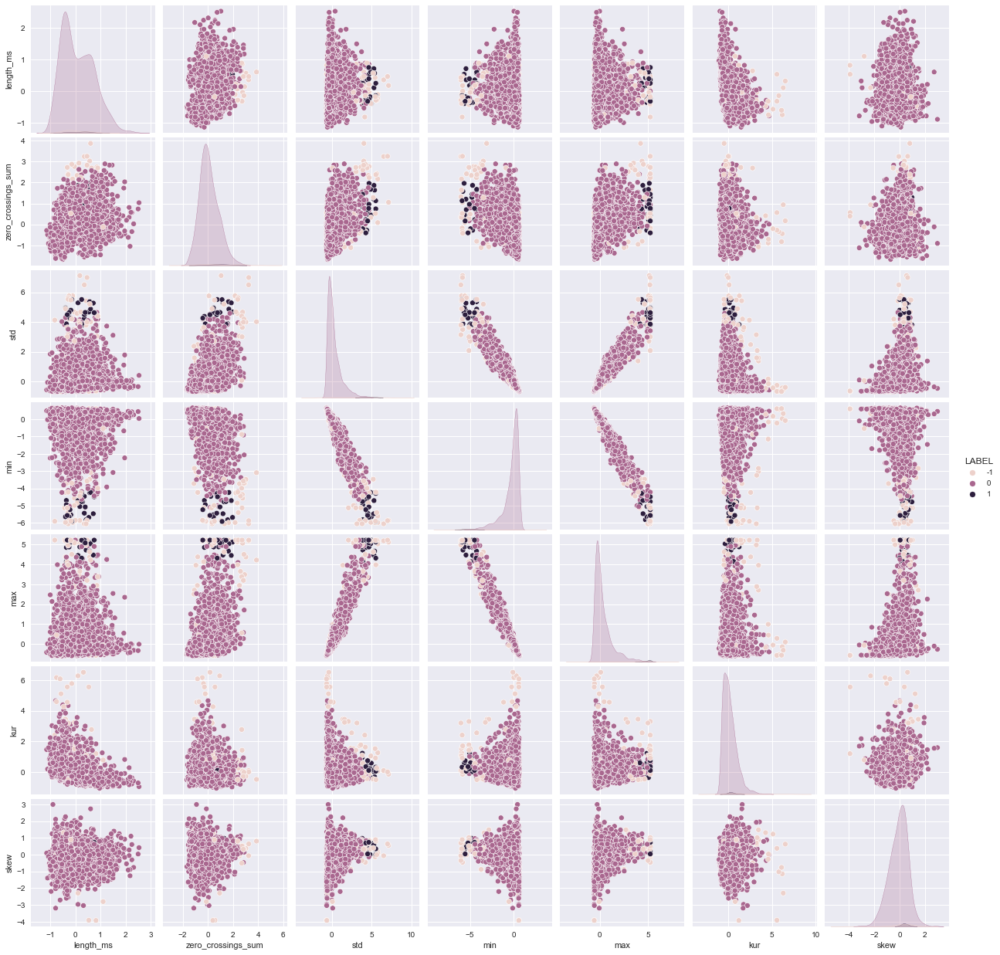

In [43]:

best_dbscan_model = DBSCAN( eps = 1.5, min_samples = 20)

# Fitting
best_dbscan_model.fit(scaled_dataframe)

# Extracting labels
scaled_dataframe["LABEL"] = best_dbscan_model.labels_

# Pairplot
sns.pairplot( scaled_dataframe, hue = "LABEL" ); plt.show()


In [44]:
res_noise=best_dbscan_model.labels_[best_dbscan_model.labels_ == -1].size
res_0=best_dbscan_model.labels_[best_dbscan_model.labels_ == 0].size
res_1=best_dbscan_model.labels_[best_dbscan_model.labels_ == 1].size
sil=silhouette_score(X11_scal, best_dbscan_model.labels_)

print(res_noise,res_0,res_1,sil)


# OPZIONE SCARTATA

52 2343 22 0.5762373449684195


OPZIONE 2

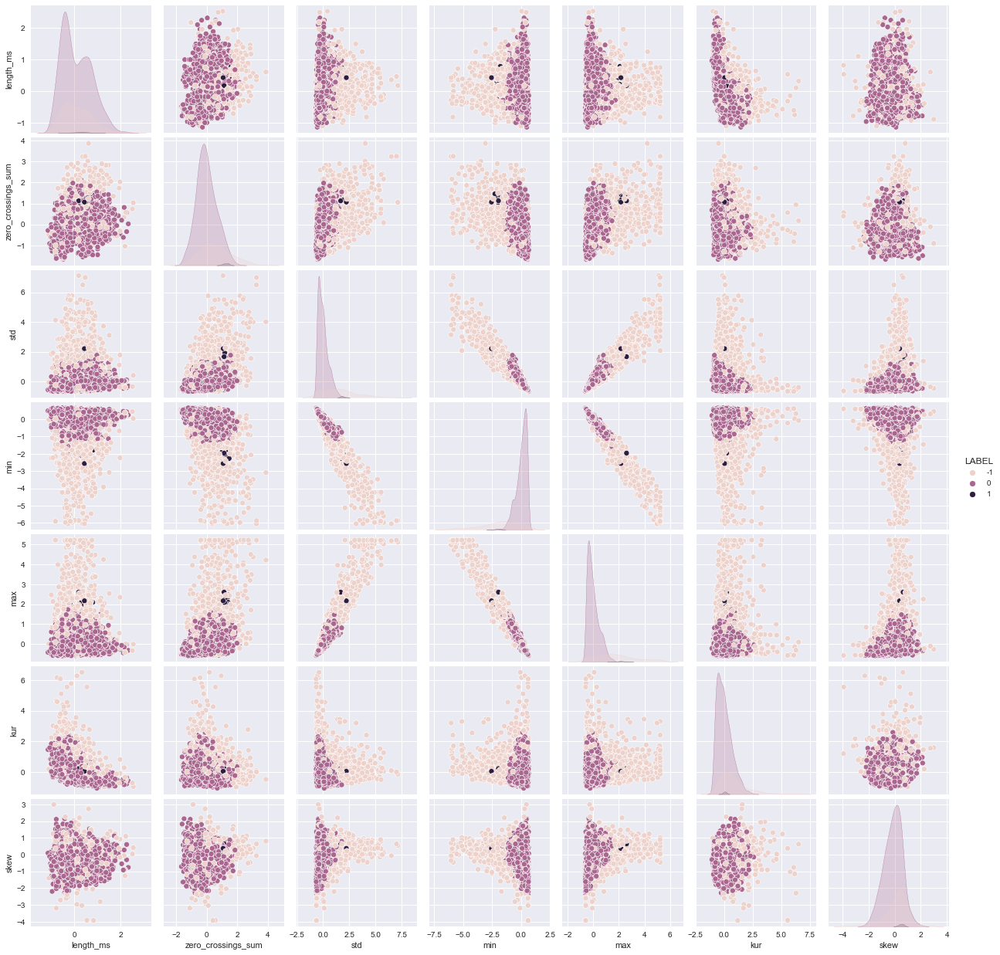

In [45]:

best_dbscan_model = DBSCAN( eps = 0.7, min_samples = 10)

# Fitting
best_dbscan_model.fit(scaled_dataframe)

# Extracting labels
scaled_dataframe["LABEL"] = best_dbscan_model.labels_

# Pairplot
sns.pairplot( scaled_dataframe, hue = "LABEL" ); plt.show()

In [46]:
res_noise=best_dbscan_model.labels_[best_dbscan_model.labels_ == -1].size
res_0=best_dbscan_model.labels_[best_dbscan_model.labels_ == 0].size
res_1=best_dbscan_model.labels_[best_dbscan_model.labels_ == 1].size
sil=silhouette_score(X11_scal, best_dbscan_model.labels_)

print(res_noise,res_0,res_1,sil)


# OPZIONE SCARTATA

546 1861 10 0.2689017025449391


OPZIONE 3

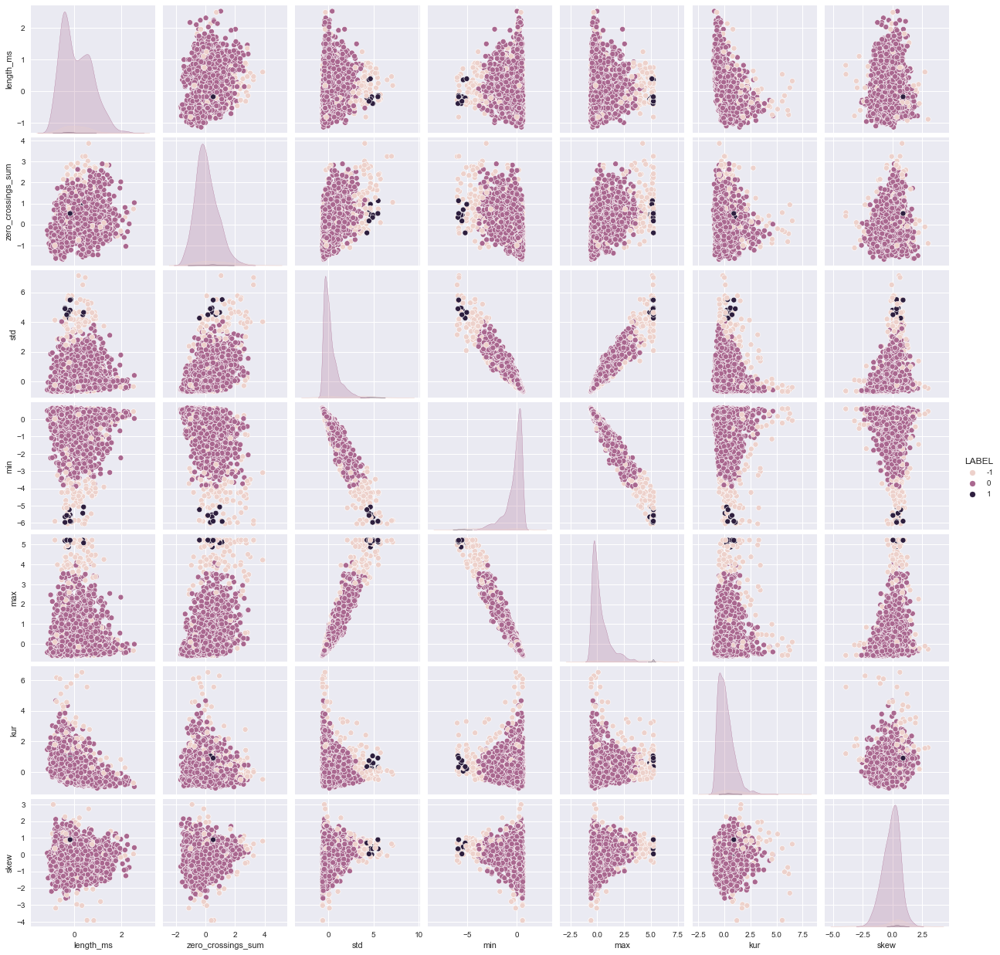

In [47]:
best_dbscan_model = DBSCAN( eps = 1.2, min_samples = 10)

# Fitting
best_dbscan_model.fit(scaled_dataframe)

# Extracting labels
scaled_dataframe["LABEL"] = best_dbscan_model.labels_

# Pairplot
sns.pairplot( scaled_dataframe, hue = "LABEL" ); plt.show()

In [48]:
res_noise=best_dbscan_model.labels_[best_dbscan_model.labels_ == -1].size
res_0=best_dbscan_model.labels_[best_dbscan_model.labels_ == 0].size
res_1=best_dbscan_model.labels_[best_dbscan_model.labels_ == 1].size
sil=silhouette_score(X11_scal, best_dbscan_model.labels_)

print(res_noise,res_0,res_1,sil)


# OPZIONE SCARTATA

146 2261 10 0.49677831337039213


OPZIONE 4

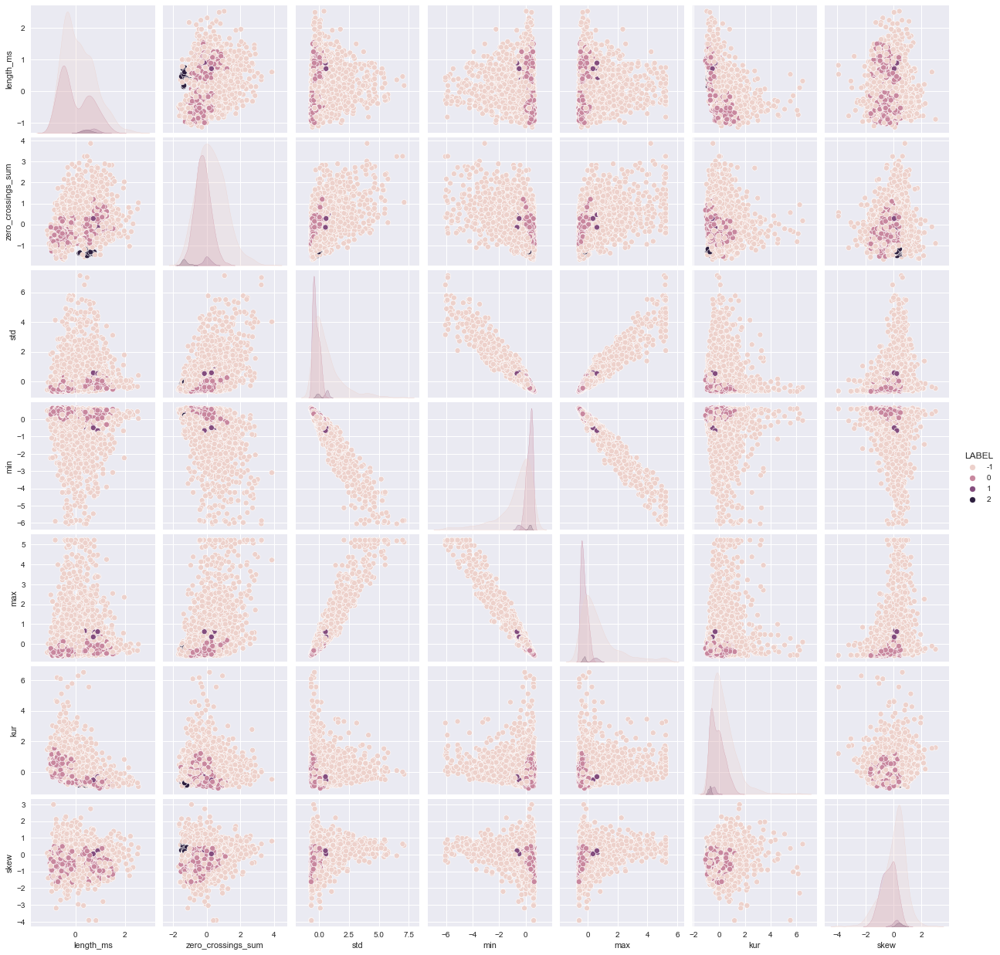

In [49]:
best_dbscan_model = DBSCAN( eps = 0.5, min_samples = 15)

# Fitting
best_dbscan_model.fit(scaled_dataframe)

# Extracting labels
scaled_dataframe["LABEL"] = best_dbscan_model.labels_

# Pairplot
sns.pairplot( scaled_dataframe, hue = "LABEL" ); plt.show()

In [50]:
res_noise=best_dbscan_model.labels_[best_dbscan_model.labels_ == -1].size
res_0=best_dbscan_model.labels_[best_dbscan_model.labels_ == 0].size
res_1=best_dbscan_model.labels_[best_dbscan_model.labels_ == 1].size
sil=silhouette_score(X11_scal, best_dbscan_model.labels_)

print(res_noise,res_0,res_1,sil)


# OPZIONE SCARTATA

1608 766 28 -0.1834138119083133


ALTRI TEST DBSCAN

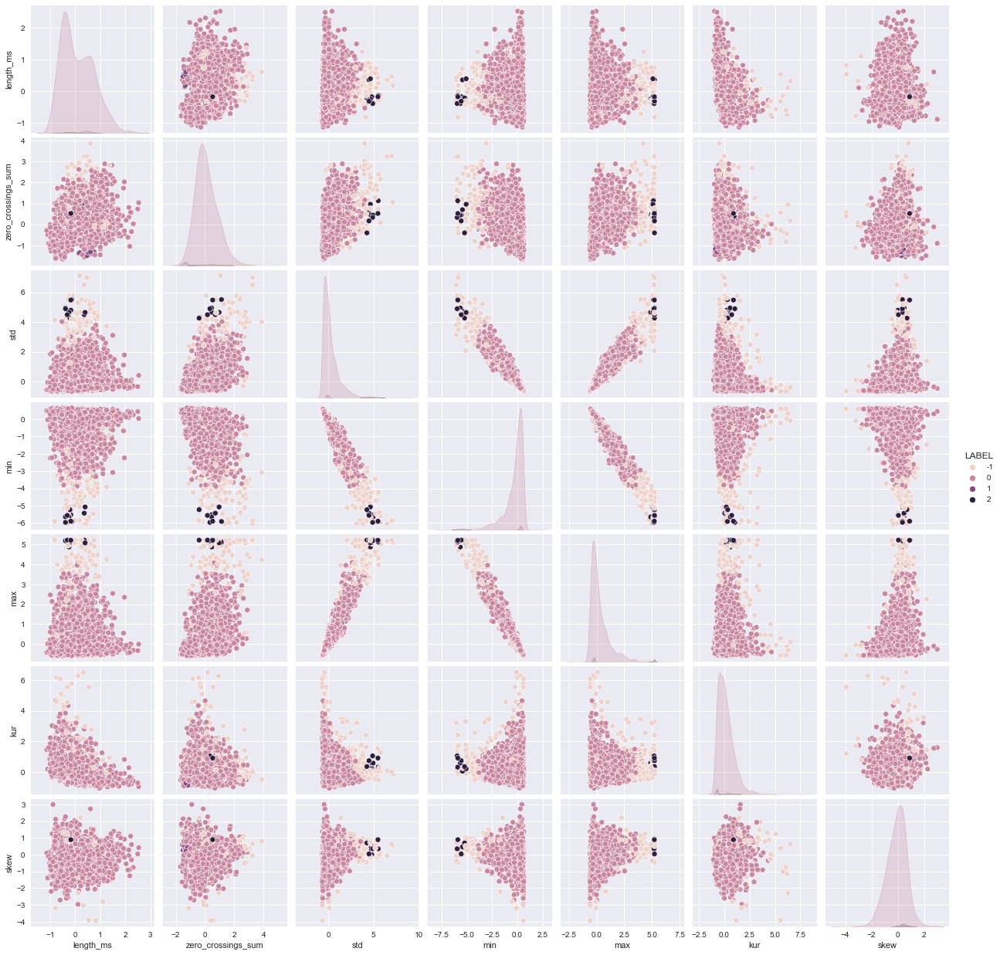

In [51]:
best_dbscan_model = DBSCAN( eps = 1.2, min_samples = 10)

# Fitting
best_dbscan_model.fit(scaled_dataframe)

# Extracting labels
scaled_dataframe["LABEL"] = best_dbscan_model.labels_

# Pairplot
sns.pairplot( scaled_dataframe, hue = "LABEL" ); plt.show()

In [52]:
res_noise=best_dbscan_model.labels_[best_dbscan_model.labels_ == -1].size
res_0=best_dbscan_model.labels_[best_dbscan_model.labels_ == 0].size
res_1=best_dbscan_model.labels_[best_dbscan_model.labels_ == 1].size
res_2=best_dbscan_model.labels_[best_dbscan_model.labels_ == 2].size
sil=silhouette_score(X11_scal, best_dbscan_model.labels_)

print(res_noise,res_0,res_1,res_2,sil)


116 2276 15 10 -0.04407618771083999


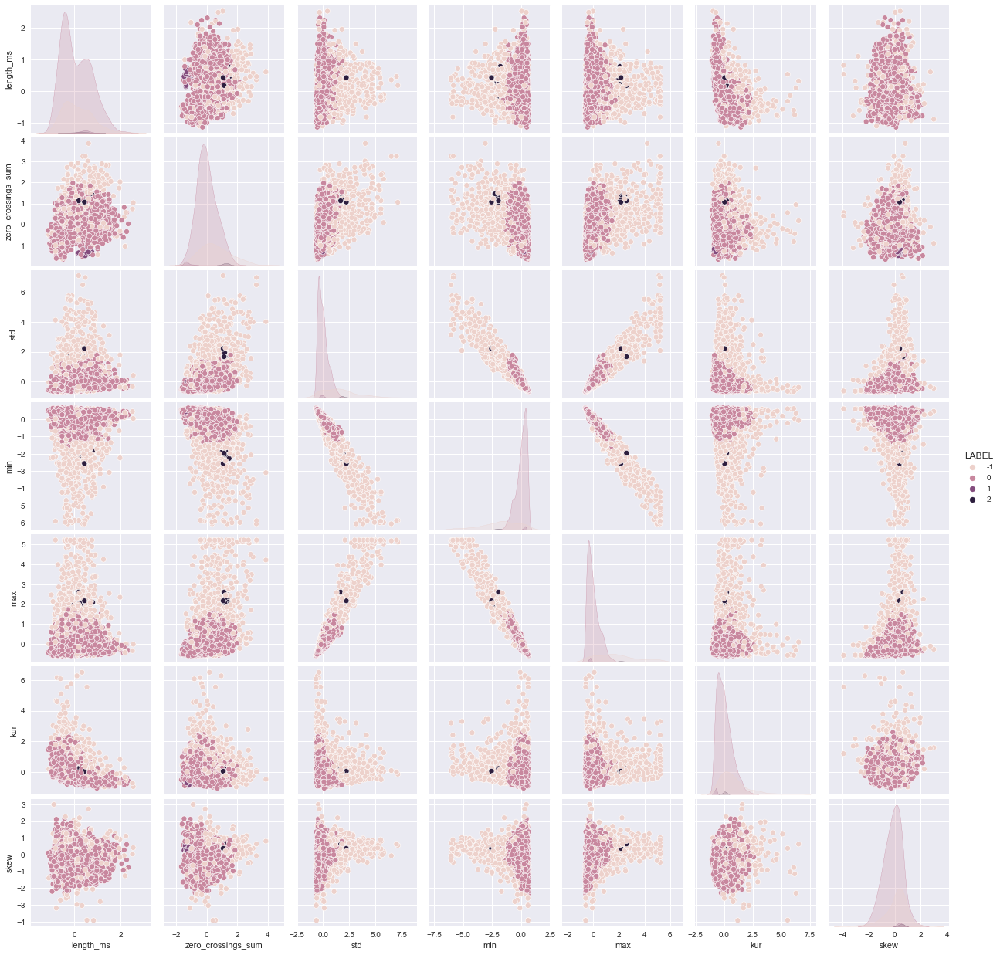

In [53]:
best_dbscan_model = DBSCAN( eps = 0.7, min_samples = 10)

# Fitting
best_dbscan_model.fit(scaled_dataframe)

# Extracting labels
scaled_dataframe["LABEL"] = best_dbscan_model.labels_

# Pairplot
sns.pairplot( scaled_dataframe, hue = "LABEL" ); plt.show()

In [54]:
res_noise=best_dbscan_model.labels_[best_dbscan_model.labels_ == -1].size
res_0=best_dbscan_model.labels_[best_dbscan_model.labels_ == 0].size
res_1=best_dbscan_model.labels_[best_dbscan_model.labels_ == 1].size

sil=silhouette_score(X11_scal, best_dbscan_model.labels_)

print(res_noise,res_0,res_1,sil)

547 1845 15 -0.0572260540548968


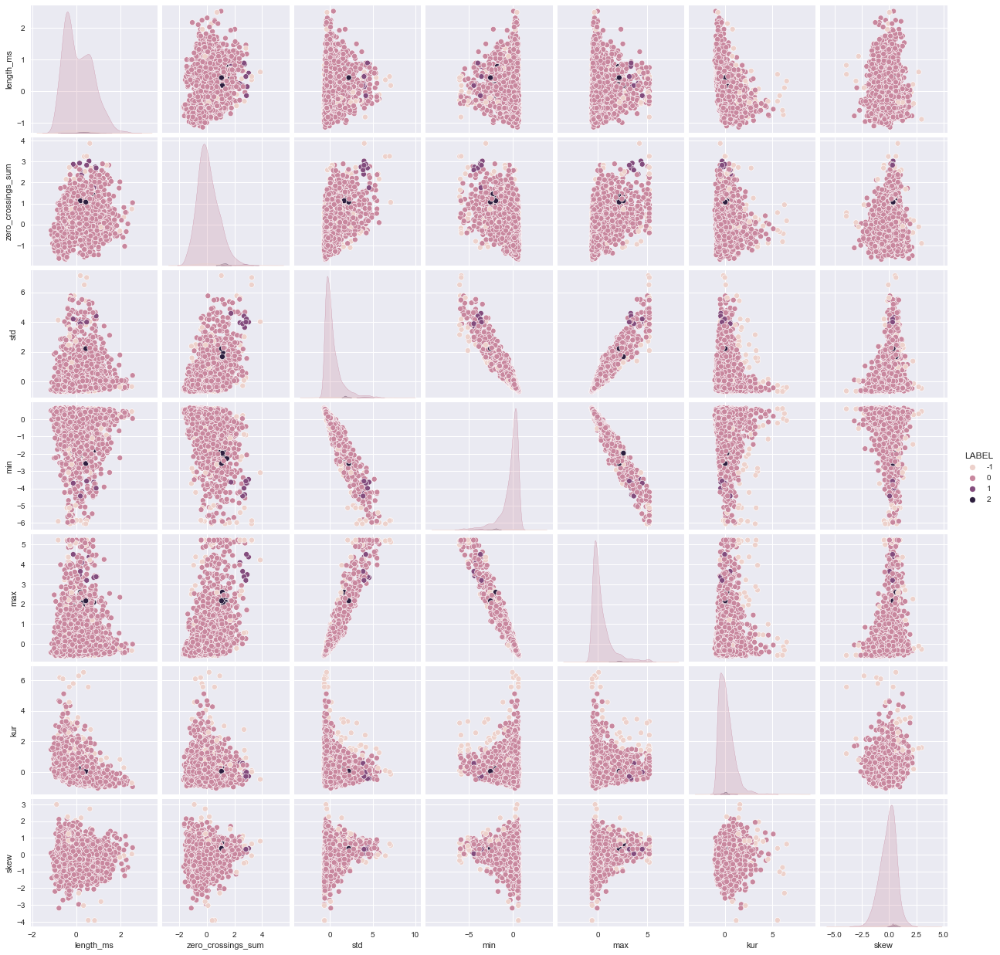

In [55]:
best_dbscan_model = DBSCAN( eps = 1.2, min_samples = 5)

# Fitting
best_dbscan_model.fit(scaled_dataframe)

# Extracting labels
scaled_dataframe["LABEL"] = best_dbscan_model.labels_

# Pairplot
sns.pairplot( scaled_dataframe, hue = "LABEL" ); plt.show()

In [56]:
res_noise=best_dbscan_model.labels_[best_dbscan_model.labels_ == -1].size
res_0=best_dbscan_model.labels_[best_dbscan_model.labels_ == 0].size
res_1=best_dbscan_model.labels_[best_dbscan_model.labels_ == 1].size
res_2=best_dbscan_model.labels_[best_dbscan_model.labels_ == 2].size
res_3=best_dbscan_model.labels_[best_dbscan_model.labels_ == 3].size
sil=silhouette_score(X11_scal, best_dbscan_model.labels_)

print(res_noise,res_0,res_1,res_2,res_3,sil)

59 2339 9 10 0 0.21305754603186378


CLUSTERING GERARCHICO(AGGLOMERATIVO)

In [57]:
#Funzione per stampare i dendogrammi relativi ad un determinato modello

def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

Primo esperimento: nessun cluster come parametro, linkage=complete

In [58]:
X11=continuos_df[original_audio2]
scaler = RobustScaler() 
scaler.fit(X11)
X11_scal = scaler.transform(X11)

In [59]:
# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, affinity='euclidean', linkage='complete')
model = model.fit(X11_scal)  

In [60]:
pd.value_counts(model.labels_)

1867    1
1497    1
814     1
857     1
1061    1
       ..
1748    1
1877    1
2349    1
1394    1
0       1
Length: 2417, dtype: int64

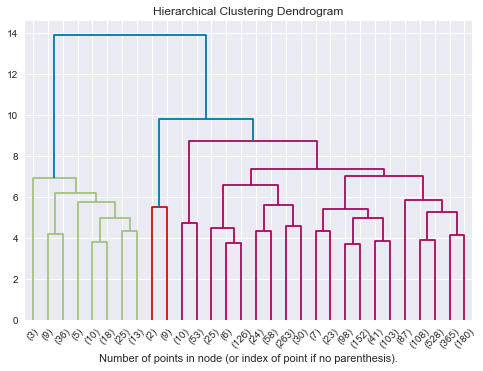

In [61]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode="lastp")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

Secondo esperimento:nessun cluster come parametro, linkage=single

In [62]:
# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, affinity='euclidean', linkage='single')
model = model.fit(X11_scal) 

In [63]:
pd.value_counts(model.labels_)

1543    1
1781    1
618     1
752     1
1199    1
       ..
614     1
2085    1
923     1
899     1
0       1
Length: 2417, dtype: int64

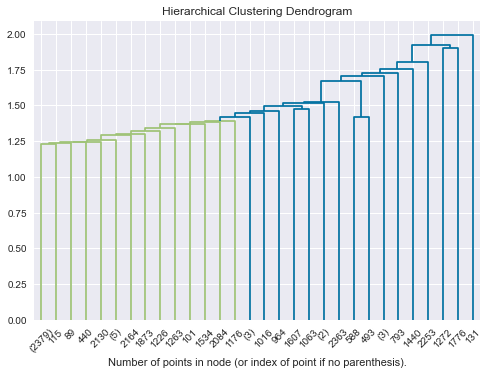

In [64]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode="lastp")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

Terzo esperimento: nessun cluster come parametro, linkage=average

In [65]:
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, affinity='euclidean', linkage='average')
model = model.fit(X11_scal) 

In [66]:
pd.value_counts(model.labels_)

1831    1
463     1
1410    1
450     1
346     1
       ..
1668    1
1905    1
2349    1
1512    1
0       1
Length: 2417, dtype: int64

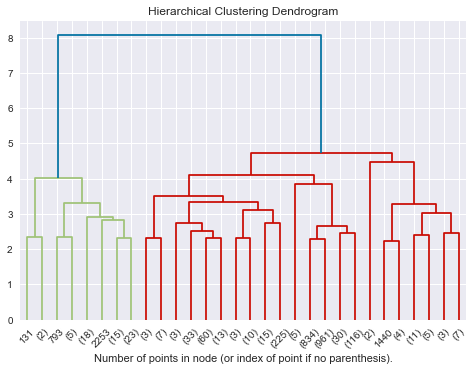

In [67]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode="lastp")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

Esperimento nessun cluster ma usando ward

In [93]:
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, affinity='euclidean', linkage='ward')
model = model.fit(X11_scal) 

In [94]:
pd.value_counts(model.labels_)

1853    1
1849    1
1757    1
856     1
391     1
       ..
1753    1
2184    1
2350    1
1245    1
0       1
Length: 2417, dtype: int64

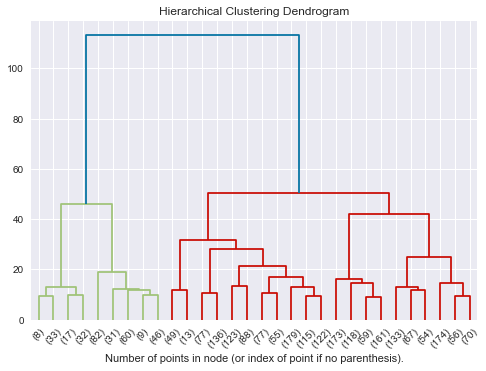

In [95]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode="lastp")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

Quarto esperimento: 2,3(migliore),4 cluster e linkage=complete

In [68]:
#Precalcolo matrice delle distanze

dist = pdist(X11_scal, 'euclidean') # usiamo la distanza euclidea
dist = squareform(dist) #miglior formattazione della matrice

In [96]:
model = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='complete')
model = model.fit(dist) 

c:\Users\david\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:541: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  out = hierarchy.linkage(X, method=linkage, metric=affinity)


In [97]:
pd.value_counts(model.labels_)

2    2282
0      97
1      38
dtype: int64

Quinto esperimento: 4,3(migliore),2 cluster con linkage=average

In [117]:
model = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='average')
model = model.fit(dist) 

c:\Users\david\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:541: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  out = hierarchy.linkage(X, method=linkage, metric=affinity)


In [99]:
pd.value_counts(model.labels_)

0    2310
1     101
2       6
dtype: int64

Esperimento con ward + ward con 3,4,5 cluster

In [73]:
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, affinity='euclidean', 
                                linkage='ward')
model = model.fit(X11_scal)

In [74]:
pd.value_counts(model.labels_)

1853    1
1849    1
1757    1
856     1
391     1
       ..
1753    1
2184    1
2350    1
1245    1
0       1
Length: 2417, dtype: int64

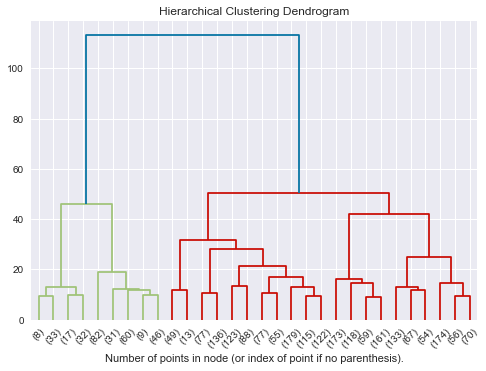

In [75]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode="lastp")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [135]:
model = AgglomerativeClustering(n_clusters=3, affinity='euclidean', 
                                linkage='ward')
model = model.fit(X11_scal)

In [136]:
print('silhouette', silhouette_score(X11_scal, model.labels_))
pd.value_counts(model.labels_)

silhouette 0.20114512107036384


1    1065
2    1034
0     318
dtype: int64

In [113]:
model = AgglomerativeClustering(n_clusters=4, affinity='euclidean', 
                                linkage='ward')
model = model.fit(X11_scal)

In [114]:
print('silhouette', silhouette_score(X11_scal, model.labels_))
pd.value_counts(model.labels_)

silhouette 0.19917467000431152


0    1065
2    1034
1     228
3      90
dtype: int64

In [115]:
model = AgglomerativeClustering(n_clusters=5, affinity='euclidean', 
                                linkage='ward')
model = model.fit(X11_scal)

In [116]:
print('silhouette', silhouette_score(X11_scal, model.labels_))
pd.value_counts(model.labels_)

silhouette 0.18727576515521413


0    1034
2     554
4     511
1     228
3      90
dtype: int64

Esperimento average con 3,4,5 clusters

In [120]:
model = AgglomerativeClustering(n_clusters=3, affinity='euclidean', 
                                linkage='average')
model = model.fit(X11_scal)

print('silhouette', silhouette_score(X11_scal, model.labels_))
pd.value_counts(model.labels_)

silhouette 0.40804601818703495


2    2318
1      66
0      33
dtype: int64

In [121]:
model = AgglomerativeClustering(n_clusters=4, affinity='euclidean', 
                                linkage='average')
model = model.fit(X11_scal)

print('silhouette', silhouette_score(X11_scal, model.labels_))
pd.value_counts(model.labels_)

silhouette 0.3895650975025204


0    2318
1      66
2      31
3       2
dtype: int64

In [122]:
model = AgglomerativeClustering(n_clusters=5, affinity='euclidean', 
                                linkage='average')
model = model.fit(X11_scal)

print('silhouette', silhouette_score(X11_scal, model.labels_))
pd.value_counts(model.labels_)

silhouette 0.3936095447171534


1    1946
4     372
0      66
2      31
3       2
dtype: int64

Esperimento complete con 3,4,5 clusters

In [123]:
model = AgglomerativeClustering(n_clusters=3, affinity='euclidean', 
                                linkage='complete')
model = model.fit(X11_scal)

print('silhouette', silhouette_score(X11_scal, model.labels_))
pd.value_counts(model.labels_)

silhouette 0.5262066308792103


0    2287
1     119
2      11
dtype: int64

In [124]:
model = AgglomerativeClustering(n_clusters=4, affinity='euclidean', 
                                linkage='complete')
model = model.fit(X11_scal)

print('silhouette', silhouette_score(X11_scal, model.labels_))
pd.value_counts(model.labels_)

silhouette 0.4338144328078387


0    2224
1     119
3      63
2      11
dtype: int64

In [125]:
model = AgglomerativeClustering(n_clusters=5, affinity='euclidean', 
                                linkage='complete')
model = model.fit(X11_scal)

print('silhouette', silhouette_score(X11_scal, model.labels_))
pd.value_counts(model.labels_)

silhouette 0.09439383539863933


0    1692
4     532
1     119
3      63
2      11
dtype: int64

Esperimento ward + connectivity(neighbors=100)

In [80]:
# hierarchical clustering
from sklearn.neighbors import kneighbors_graph


connectivity = kneighbors_graph(X11_scal, n_neighbors=100, include_self=False)

In [81]:
# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, affinity='euclidean', 
                                linkage='ward', connectivity=connectivity)
model = model.fit(X11_scal)

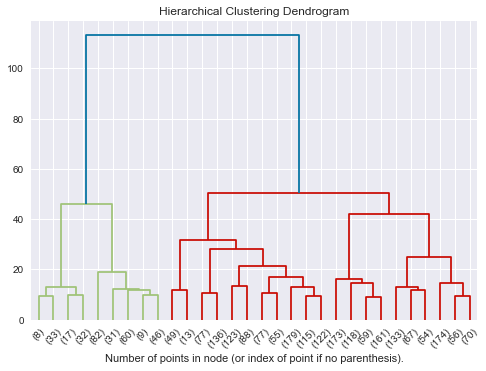

In [82]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode="lastp")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [134]:
ward = AgglomerativeClustering(n_clusters=3, linkage='ward', affinity='euclidean',
                                   connectivity=connectivity)
ward.fit(X11_scal)

hist, bins = np.histogram(ward.labels_, bins=range(0, len(set(ward.labels_)) + 1))
print('labels', dict(zip(bins, hist)))
print('silhouette', silhouette_score(X11_scal, ward.labels_))

labels {0: 318, 1: 1066, 2: 1033}
silhouette 0.20123214664630526


In [130]:
ward = AgglomerativeClustering(n_clusters=4, linkage='ward', affinity='euclidean',
                                   connectivity=connectivity)
ward.fit(X11_scal)

hist, bins = np.histogram(ward.labels_, bins=range(0, len(set(ward.labels_)) + 1))
print('labels', dict(zip(bins, hist)))
print('silhouette', silhouette_score(X11_scal, ward.labels_))

labels {0: 1066, 1: 228, 2: 1033, 3: 90}
silhouette 0.1992503377864146


In [131]:
ward = AgglomerativeClustering(n_clusters=5, linkage='ward', affinity='euclidean',
                                   connectivity=connectivity)
ward.fit(X11_scal)

hist, bins = np.histogram(ward.labels_, bins=range(0, len(set(ward.labels_)) + 1))
print('labels', dict(zip(bins, hist)))
print('silhouette', silhouette_score(X11_scal, ward.labels_))

labels {0: 1033, 1: 228, 2: 554, 3: 90, 4: 512}
silhouette 0.1872768135197297


Esperimento complete + connectivity

In [85]:
ward = AgglomerativeClustering(n_clusters=4, linkage='complete', affinity='euclidean',
                                   connectivity=connectivity)
ward.fit(X11_scal)

hist, bins = np.histogram(ward.labels_, bins=range(0, len(set(ward.labels_)) + 1))
print('labels', dict(zip(bins, hist)))
print('silhouette', silhouette_score(X11_scal, ward.labels_))

labels {0: 52, 1: 21, 2: 2, 3: 2342}
silhouette 0.5399383413530084


Esperimento average + connectivity per 3,4,5 clusters

In [140]:
ward = AgglomerativeClustering(n_clusters=3, linkage='average', affinity='euclidean',
                                   connectivity=connectivity)
ward.fit(X11_scal)

hist, bins = np.histogram(ward.labels_, bins=range(0, len(set(ward.labels_)) + 1))
print('labels', dict(zip(bins, hist)))
print('silhouette', silhouette_score(X11_scal, ward.labels_))

labels {0: 2413, 1: 2, 2: 2}
silhouette 0.5430690456883335


In [143]:
ward = AgglomerativeClustering(n_clusters=4, linkage='average', affinity='euclidean',
                                   connectivity=connectivity)
ward.fit(X11_scal)

hist, bins = np.histogram(ward.labels_, bins=range(0, len(set(ward.labels_)) + 1))
print('labels', dict(zip(bins, hist)))
print('silhouette', silhouette_score(X11_scal, ward.labels_))

labels {0: 2411, 1: 2, 2: 2, 3: 2}
silhouette 0.5236837537110764


In [144]:
ward = AgglomerativeClustering(n_clusters=5, linkage='average', affinity='euclidean',
                                   connectivity=connectivity)
ward.fit(X11_scal)

hist, bins = np.histogram(ward.labels_, bins=range(0, len(set(ward.labels_)) + 1))
print('labels', dict(zip(bins, hist)))
print('silhouette', silhouette_score(X11_scal, ward.labels_))

labels {0: 2407, 1: 4, 2: 2, 3: 2, 4: 2}
silhouette 0.46373325077190813


Esperimento ward + connectivity(neighbors=10)

In [87]:
connectivity = kneighbors_graph(X11_scal, n_neighbors=10, include_self=False)

In [88]:
# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, affinity='euclidean', 
                                linkage='ward', connectivity=connectivity)
model = model.fit(X11_scal)

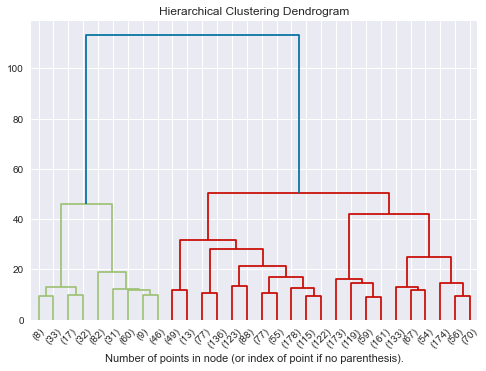

In [89]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode="lastp")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [90]:
ward = AgglomerativeClustering(n_clusters=3, linkage='ward', affinity='euclidean',
                                   connectivity=connectivity)
ward.fit(X11_scal)

hist, bins = np.histogram(ward.labels_, bins=range(0, len(set(ward.labels_)) + 1))
print('labels', dict(zip(bins, hist)))
print('silhouette', silhouette_score(X11_scal, ward.labels_))

labels {0: 318, 1: 1066, 2: 1033}
silhouette 0.20123214664630526


Esperimento average + connectivity

In [91]:
ward = AgglomerativeClustering(n_clusters=3, linkage='average', affinity='euclidean',
                                   connectivity=connectivity)
ward.fit(X11_scal)

hist, bins = np.histogram(ward.labels_, bins=range(0, len(set(ward.labels_)) + 1))
print('labels', dict(zip(bins, hist)))
print('silhouette', silhouette_score(X11_scal, ward.labels_))

labels {0: 2413, 1: 2, 2: 2}
silhouette 0.5430690456883335


Esperimento complete + connectivity

In [92]:
ward = AgglomerativeClustering(n_clusters=3, linkage='complete', affinity='euclidean',
                                   connectivity=connectivity)
ward.fit(X11_scal)

hist, bins = np.histogram(ward.labels_, bins=range(0, len(set(ward.labels_)) + 1))
print('labels', dict(zip(bins, hist)))
print('silhouette', silhouette_score(X11_scal, ward.labels_))

labels {0: 1965, 1: 2, 2: 450}
silhouette 0.08747272861086532
